In [5]:
import os
import sys
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math
import numpy as np
import pandas as pd
import datetime
import pytz
import joblib
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot
from datetime import date
import holidays

In [6]:
# Auto-reload to directly apply changes 
%load_ext autoreload
%autoreload 2

# Display all columns
pd.set_option("display.max_columns", None)

# Import data



In [83]:
WORKDIR = os.getcwd()
DATADIR = os.path.join(WORKDIR, 'data')

In [84]:
# Load data
from pyprojroot import here
df = ( 
        pd.read_csv(f"{DATADIR}/load_actuals.csv")
          .set_index("data_index_")
)
# Set timezone
df.index = pd.to_datetime(df.index).tz_convert("Europe/Amsterdam")

# Check for gaps in time series

In [85]:
min_time = min(df.index)
max_time = max(df.index)

In [86]:
dt_idx = pd.date_range(min_time, max_time, freq='H')
dt_idx

DatetimeIndex(['2020-01-01 01:00:00+01:00', '2020-01-01 02:00:00+01:00',
               '2020-01-01 03:00:00+01:00', '2020-01-01 04:00:00+01:00',
               '2020-01-01 05:00:00+01:00', '2020-01-01 06:00:00+01:00',
               '2020-01-01 07:00:00+01:00', '2020-01-01 08:00:00+01:00',
               '2020-01-01 09:00:00+01:00', '2020-01-01 10:00:00+01:00',
               ...
               '2021-06-09 17:00:00+02:00', '2021-06-09 18:00:00+02:00',
               '2021-06-09 19:00:00+02:00', '2021-06-09 20:00:00+02:00',
               '2021-06-09 21:00:00+02:00', '2021-06-09 22:00:00+02:00',
               '2021-06-09 23:00:00+02:00', '2021-06-10 00:00:00+02:00',
               '2021-06-10 01:00:00+02:00', '2021-06-10 02:00:00+02:00'],
              dtype='datetime64[ns, Europe/Amsterdam]', length=12625, freq='H')

In [87]:
df = df.reindex(dt_idx, fill_value='missing').rename_axis("data_index_")

In [88]:

df[df.isnull().all(axis=1)]

,load_actuals_mw
data_index_,


In [89]:
df.isnull().sum()

load_actuals_mw    0
dtype: int64

# Data exploration

In [90]:
# Visualise results
def plot_figure_load(df):
    fig = go.Figure(
        make_subplots(
            shared_xaxes=True, vertical_spacing=0.02,
        )
    )
    fig.add_trace(
        go.Scatter(
            x=df.index,
            y=df["load_actuals_mw"],
            name="Actual",
            legendgroup="Actual",
            showlegend=True,
            line_color="green",
            opacity=0.5,
        ))
    title_text = "Energy demand"
    fig.update_layout(title={'text': title_text,
                             'y': 0.95,
                             'x': 0.5,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      autosize=False,
                      width=800,
                      height=800,
                      paper_bgcolor='white',
                      plot_bgcolor='white'
                      )

    fig.update_yaxes(title_text="Demand [MW]", title_standoff=30, title_font=dict(size=12),
                     showgrid=True, gridcolor='lightgrey',
                     zeroline=True, zerolinecolor='lightgrey',
                     )
    fig.update_xaxes(title_text="Date",
                     showgrid=True, gridcolor='lightgrey',
                     zeroline=True, zerolinecolor='lightgrey',
                     )

    return fig

In [91]:
fig = plot_figure_load(df)
fig.show()

# Deal with outliers

<AxesSubplot:xlabel='data_index_'>

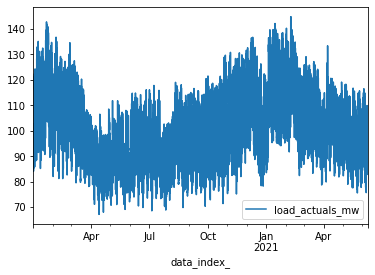

In [92]:
#deal with outliers

df = df.assign(
    load_actuals_mw = lambda df: df.load_actuals_mw.replace([df.load_actuals_mw.min()], df.load_actuals_mw.median())
)
df.plot()

# 1. Batch model

## 1A. Baseline model

Because demand has a strong daily and weekly pattern, the baseline model is a seasonal naive forecats. The predicted demand is the demand at the same time of the day 1 week ago.

In [93]:
# Baseline model: Shifted by 1 week
df_load_baseline = df.copy(deep=True).reset_index()[["load_actuals_mw"]]

df_load_baseline["data_index_"] = pd.to_datetime(
  df.reset_index()["data_index_"]
) + datetime.timedelta(weeks=1)

df_load_baseline = df_load_baseline.set_index("data_index_").rename(
    columns={"load_actuals_mw": "baseline"}
)

<AxesSubplot:xlabel='data_index_'>

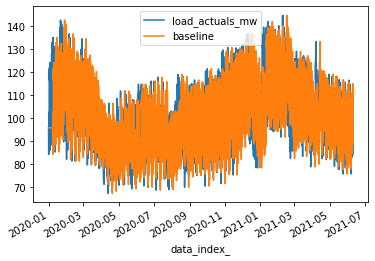

In [94]:
baseline_predict =pd.merge(df,df_load_baseline,how='left',left_on=['data_index_'],right_on=['data_index_']).fillna(method="bfill")
baseline_predict.plot()

In [95]:
# Plot next to each other
fig = plot_figure_load(df)

# Plot baseline prediction
fig.add_trace(
    go.Scatter(
        x=df_load_baseline.index,
        y=df_load_baseline["baseline"],
        name="Baseline model",
        legendgroup="Baseline model",
        showlegend=True,
        line_color="orange",
        opacity=0.5,
    ),
    col=1,
    row=1,
)

# Feature engineering 

In [96]:
df =df.assign(hour =  lambda df: df.index.hour,
              quarter_of_day = lambda df: pd.cut(df.hour, bins=4, labels=False) +1 ,
              date =df.index,
              day_of_week = lambda df: df.date.dt.weekday,
              )

In [97]:
sw_holidays = holidays.Netherlands()

df['is_holiday'] = [
    1 if str(val).split()[0] in  sw_holidays else 0 for val in df.index
                   ]

In [102]:
temperature = ( pd.read_csv(f"{DATADIR}/weather.csv")
                  .set_index("data_index_")

)
# Set timezone
temperature.index = pd.to_datetime(temperature.index).tz_convert("Europe/Amsterdam")
temperature = temperature.reindex(dt_idx).rename_axis("data_index_")

In [104]:
#check Temperature data for nulls
temperature.isnull().sum()

temperature    0
solar_ghi      0
dtype: int64

In [106]:
df =pd.merge(df,temperature,how='left',left_on=['data_index_'],right_on=['data_index_'])

<AxesSubplot:xlabel='data_index_'>

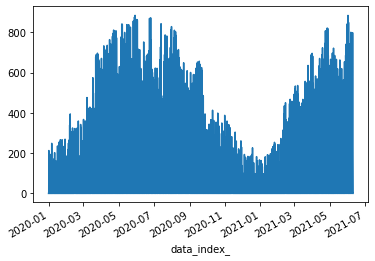

In [107]:
df.solar_ghi.plot()

<AxesSubplot:xlabel='data_index_'>

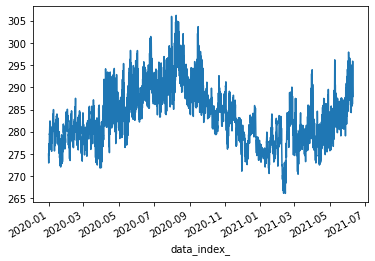

In [108]:
df.temperature.plot()

## 1B. ML model

In [109]:
# add lagged features
def generate_lagged_features(df, var, max_lag):
    for t in range(1, max_lag+1):
        df[var+'_lag'+str(t)] = df[var].shift(t, freq='1H')

generate_lagged_features(df, 'load_actuals_mw', 6)
# generate_lagged_features(df, 'demand', 6)        

In [110]:
#fill na values
df =df.fillna(method="bfill")
df

,load_actuals_mw,hour,quarter_of_day,date,day_of_week,is_holiday,temperature,solar_ghi,load_actuals_mw_lag1,load_actuals_mw_lag2,load_actuals_mw_lag3,load_actuals_mw_lag4,load_actuals_mw_lag5,load_actuals_mw_lag6
data_index_,,,,,,,,,,,,,,
2020-01-01 01:00:00+01:00,95.756328,1,1,2020-01-01 01:00:00+01:00,2,1,274.989655,0.000000,95.756328,95.756328,95.756328,95.756328,95.756328,95.756328
2020-01-01 02:00:00+01:00,91.506670,2,1,2020-01-01 02:00:00+01:00,2,1,274.423157,0.000000,95.756328,95.756328,95.756328,95.756328,95.756328,95.756328
2020-01-01 03:00:00+01:00,87.394102,3,1,2020-01-01 03:00:00+01:00,2,1,274.266571,0.000000,91.506670,95.756328,95.756328,95.756328,95.756328,95.756328
2020-01-01 04:00:00+01:00,84.923467,4,1,2020-01-01 04:00:00+01:00,2,1,274.130737,0.000000,87.394102,91.506670,95.756328,95.756328,95.756328,95.756328
2020-01-01 05:00:00+01:00,84.112076,5,1,2020-01-01 05:00:00+01:00,2,1,273.969421,0.000000,84.923467,87.394102,91.506670,95.756328,95.756328,95.756328
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-09 22:00:00+02:00,102.034949,22,4,2021-06-09 22:00:00+02:00,2,0,290.521515,0.000251,102.845906,104.175466,107.161133,108.084835,105.803766,105.712229
2021-06-09 23:00:00+02:00,99.569507,23,4,2021-06-09 23:00:00+02:00,2,0,289.597931,0.000000,102.034949,102.845906,104.175466,107.161133,108.084835,105.803766
2021-06-10 00:00:00+02:00,94.768896,0,1,2021-06-10 00:00:00+02:00,3,0,288.980194,0.000000,99.569507,102.034949,102.845906,104.175466,107.161133,108.084835


In [111]:
def add_fourier_features(df, column_name, period, n, period_name = "f"):
    t = df[column_name]
    for i in range(n):
        j = math.ceil((i+1)/2)
        if i%2:
            df[f'{period_name}_{i}'] = np.cos(j * 2 * np.pi * t / period)
        else:
            df[f'{period_name}_{i}'] = np.sin(j * 2 * np.pi * t / period)
    return df

def create_workday_weekend_features(df, fourier_order):
    # split features in workday / weekend
    df['is_workday'] = (~(df.is_holiday.astype(bool) | (df.day_of_week == 5) | (df.day_of_week == 6)))
    workday_data = {
        f'workday_{k}':df[k]*df.is_workday.astype(int)
        for k
        in ['temperature', 'solar_ghi'] + [f'f_quarter_{f}' for f in range(fourier_order)]
    }
    weekend_data = {
        f'weekend_{k}':df[k]*(~df.is_workday).astype(int)
        for k
        in ['temperature', 'solar_ghi'] + [f'f_quarter_{f}' for f in range(fourier_order)]
    }
    return workday_data, weekend_data

# add Fourier features to capture daily pattern in model
fourier_order = 6

df = add_fourier_features(df, column_name ="quarter_of_day", period= 4 * 24, n=fourier_order, period_name="f_quarter")

# split workdays and weekend/holidays
workday_data, weekend_data = create_workday_weekend_features(df, fourier_order)
df_linregr = pd.DataFrame(
    {**workday_data, **weekend_data, "load": df["load_actuals_mw"], }
)

df_linregr = pd.merge(df_linregr,df.filter(like='lag'),how='left',left_on=['data_index_'],right_on=['data_index_'])
# List the input feature columns
feat_columns = list(workday_data.keys()) + list(weekend_data.keys())+df.filter(like='lag').columns.to_list()

In [133]:
df_linregr.index.max()

Timestamp('2021-06-10 02:00:00+0200', tz='Europe/Amsterdam')

In [134]:
df_linregr.reset_index().to_csv(f"{DATADIR}/load_data_processed.csv", index=False)

In [113]:
from sklearn.metrics import mean_absolute_percentage_error

In [114]:
# Define size of train and test set of model
number_of_training_days = 30
number_of_test_days = 30

test_start_date_run_i = df_linregr.index.min() + datetime.timedelta(
    days=number_of_training_days
)
test_end_date = df_linregr.index.max()
df_result = pd.DataFrame()

# Run model for full period of data set
while True:
    print(f"Start of prediction of this run: {test_start_date_run_i}")

    # split train/test set
    df_train = df_linregr[
        test_start_date_run_i
        - datetime.timedelta(days=number_of_training_days) : test_start_date_run_i
    ]

    df_test = df_linregr[
        test_start_date_run_i : test_start_date_run_i
        + datetime.timedelta(days=number_of_test_days)
    ]

    lr = LinearRegression()
    lr.fit(df_train[feat_columns], df_train["load"])
    
    y_pred = lr.predict(df_test[feat_columns])
    
    # Combine results
    df_result_run_i = pd.DataFrame(
        {
            "load": df_test["load"],
            "pred": y_pred,
        }
    )

    # Store results in a single dataframe
    df_result = df_result.append(df_result_run_i)
    print(f'{mean_absolute_percentage_error(df_result.load, df_result.pred)}')

    # Adjust start date of test set for next run
    test_start_date_run_i = test_start_date_run_i + datetime.timedelta(
        days=number_of_test_days
    )
    if test_start_date_run_i > test_end_date:
        break 


Start of prediction of this run: 2020-01-31 01:00:00+01:00
0.019732871805886624
Start of prediction of this run: 2020-03-01 01:00:00+01:00
0.027354213475081744
Start of prediction of this run: 2020-03-31 02:00:00+02:00
0.026369971047018315
Start of prediction of this run: 2020-04-30 02:00:00+02:00
0.024382836933543164
Start of prediction of this run: 2020-05-30 02:00:00+02:00
0.02319243844910431
Start of prediction of this run: 2020-06-29 02:00:00+02:00
0.022785204252292288
Start of prediction of this run: 2020-07-29 02:00:00+02:00
0.022092542593426853
Start of prediction of this run: 2020-08-28 02:00:00+02:00
0.02165345270812975
Start of prediction of this run: 2020-09-27 02:00:00+02:00
0.021833401373526556
Start of prediction of this run: 2020-10-27 01:00:00+01:00
0.02196135957292892
Start of prediction of this run: 2020-11-26 01:00:00+01:00
0.02172658873185256
Start of prediction of this run: 2020-12-26 01:00:00+01:00
0.021458495759899703
Start of prediction of this run: 2021-01-25 

In [115]:
##MAPE of Linear Regression
mean_absolute_percentage_error(df_result.load, df_result.pred)

0.02088661778878134

In [116]:
predictions =pd.merge(df_result,df_load_baseline,how='left',left_on=['data_index_'],right_on=['data_index_'])
predictions

,load,pred,baseline
data_index_,,,
2020-01-31 01:00:00+01:00,98.686380,97.934744,114.155496
2020-01-31 02:00:00+01:00,92.662028,94.882607,109.977142
2020-01-31 03:00:00+01:00,90.706424,89.824897,107.132785
2020-01-31 04:00:00+01:00,90.193340,89.748377,104.847820
2020-01-31 05:00:00+01:00,92.823787,89.822026,108.739661
...,...,...,...
2021-06-09 22:00:00+02:00,102.034949,101.902095,105.228575
2021-06-09 23:00:00+02:00,99.569507,101.862020,101.958451
2021-06-10 00:00:00+02:00,94.768896,94.501416,96.248637


In [117]:
#MAPE of baseline model
mean_absolute_percentage_error(predictions.load, predictions.baseline)

0.04678780190534262

In [118]:
# cat_cols = ['hour', 'month', 'dayofweek']
# cat_cols_idx = [X.columns.get_loc(c) for c in X.columns if c in cat_cols]


# preprocessor = ColumnTransformer([('encoder', OneHotEncoder(sparse=False), cat_cols_idx)], remainder='passthrough')

# regr = LinearRegression(fit_intercept=True)


NameError: name 'X' is not defined

In [119]:
# Plot next to each other
fig = plot_figure_load(df)

# Plot baseline prediction
fig.add_trace(
    go.Scatter(
        x=df_result.index,
        y=df_result["pred"],
        name="Linear regression model",
        legendgroup="Linear regression model",
        showlegend=True,
        line_color="magenta",
        opacity=0.5,
    ),
    col=1,
    row=1,
)

# 2. Real time model

Deploying your model real-time will beat even advanced ML batch models in performance. Therefore the model is kept simple.

In [120]:
# Baseline model: Shifted by 15 minutes
df_load_rt = df.copy(deep=True).reset_index()[["load_actuals_mw"]]
df_load_rt["data_index_"] = pd.to_datetime(
    df.reset_index()["data_index_"]
) + datetime.timedelta(minutes=15)
df_load_rt = df_load_rt.set_index("data_index_").rename(
    columns={"load_actuals_mw": "baseline"}
)

In [157]:
# Plot next to each other
fig = plot_figure_load(df)

# Plot baseline prediction
fig.add_trace(
    go.Scatter(
        x=df_load_rt.index,
        y=df_load_rt["baseline"],
        name="Baseline model",
        legendgroup="Baseline model",
        showlegend=True,
        line_color="orange",
        opacity=0.5,
    ),
    col=1,
    row=1,
)

# Register  processed dataset

In [135]:
from azureml.core import Workspace, Dataset
ws = Workspace.from_config()


In [136]:
datastore = ws.get_default_datastore()

In [145]:
datastore.upload(src_dir='data', target_path='capstone_data', overwrite=True)

Uploading an estimated of 4 files
Uploading data\load_actuals.csv
Uploaded data\load_actuals.csv, 1 files out of an estimated total of 4
Uploading data\load_data_processed.csv
Uploaded data\load_data_processed.csv, 2 files out of an estimated total of 4
Uploading data\weather.csv
Uploaded data\weather.csv, 3 files out of an estimated total of 4
Uploading data\wind_solar_predictions.csv
Uploaded data\wind_solar_predictions.csv, 4 files out of an estimated total of 4
Uploaded 4 files


$AZUREML_DATAREFERENCE_bf5b020c45a24db0a5ace30c08246498

In [146]:
processed_dataset = Dataset.Tabular.from_delimited_files(datastore.path('capstone_data/load_data_processed.csv'))

In [147]:
processed_ds = processed_dataset.register(workspace=ws, name="capstone_data_processed", description="processed capstone energy data", create_new_version=True)